# DRVI on the epithelial compartment

Phase 03 ran DRVI on the **non-immune** compartment: 176,610 cells, 18 CellTypist labels,
57% of them stromal and vascular. Its latent dimensions therefore describe fibroblasts and
endothelium at least as much as epithelium. This notebook is the same question one lineage
deeper - what the latent dimensions say about the **epithelial** cells alone, re-processed
from scratch in 04_1.

Same recipe as `03_2_drvi_run/drvi_nonimm.ipynb`, three things changed:

- the input is `shiao_epi_hvg_2k.h5ad` (74,441 cells x 2,000 HVGs selected *on this
  compartment*), not the non-immune `shiao_nonimm_hvg_2k.h5ad`;
- **`N_LATENT = 32`**, not 64: half the cells of 03 and 10 labels of a single lineage
  instead of 18 across four;
- `compartment` is constant (`epi`) by construction and so is `fraction` (`non_imm`, since
  every epithelial label is non-immune): neither is plotted.

Nothing is inherited from 03 - not the model, not the HVGs, not the latent size. As in 02_2
and 03_2 the size is checked by eye, from how many dimensions vanish, so this notebook is run
once per candidate size. Everything that depends on that choice (model, embedding, figures)
is derived from `N_LATENT` in the configuration cell below, so a re-run at 64 never
overwrites the 32.

## Libraries

In [1]:
import os
import tempfile
from pathlib import Path

import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import drvi
from drvi.model import DRVI

import warnings
warnings.filterwarnings("ignore")

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Scanpy setting: clean white background and high resolution figures
sc.settings.set_figure_params(dpi=300, facecolor="white")
# Set the level of verbosity of scanpy to get more detailed info
sc.settings.verbosity = 3

# Tell Jupyter to show all outputs and not only the last one
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

!pip list

/home/albertoc/miniconda3/envs/benchmark-py-r/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Package                 Version       Build
----------------------- ------------- -----
absl-py                 2.5.0
aiohappyeyeballs        2.7.1
aiohttp                 3.14.1
aiosignal               1.4.0
anndata                 0.13.2
anndata2ri              2.0
annotated-types         0.7.0
annoy                   1.17.3
array-api-compat        1.15.0
asttokens               3.0.2
attrs                   26.1.0
backports.zstd          1.6.0
bbknn                   1.6.0
Brotli                  1.2.0
cached-property         1.5.2
celltypist              1.7.1
certifi                 2026.7.22
cffi                    2.1.0
charset-normalizer      3.4.9
click                   8.4.2
comm                    0.2.3
contourpy               1.3.3
cycler                  0.12.1
Cython                  3.2.8
debugpy                 1.8.21
decorator               5.3.1
Deprecated              1.3.1
docrep                  0.3.2
donfig                  0.8.1.post1
drvi-py                 0.2

## Configuration

The only cell to edit when changing the latent size: the run id, the model, the
embedding and the figure folder all follow from `N_LATENT`.

In [6]:
N_LATENT = 64        # latent dimensions, the run of this phase (re-run at 64 to compare what vanishes)
SEED = 123
N_EPOCHS = 400       # max suggested in the literature; early stopping usually fires first
OVERWRITE = False    # False reuses the model / embedding already on disk

BATCH_KEY = "cohort"       # the batch to correct, as in phase 02, 03 and in 04_1
LABEL_KEY = "cell_type"    # CellTypist, 10 labels observed in this compartment

# `epi` in the run id, so nothing here can be confused with the non-immune
# `drvi_nonimm_*` runs of 03_2 or the whole-dataset `drvi_unscaled_*` of 02_2,
# and the latent size keeps the sizes side by side.
RUN_ID = f"drvi_epi_{N_LATENT}"

PROJECT_DIR = Path("/home/albertoc/Desktop/QCB-Master-Thesis")
DATA_DIR = Path(os.environ.get("DATA_DIR", PROJECT_DIR / "datasets"))
PHASE_DIR = PROJECT_DIR / "04_drvi_epithelial"
EPI_DIR = DATA_DIR / "04_epi"      # every heavy file of this phase lives here

# Input: the 2,000-gene object written by 04_1's reduce_data_epi.py. HVGs were
# selected on the epithelial cells only, .layers['counts'] are the raw counts DRVI
# trains on.
INPUT_H5AD = EPI_DIR / "shiao_epi_hvg_2k.h5ad"
# The definitive object of 04_1 (all genes, scran log-norm, leiden): only used to
# carry the latent space over for 04_3, see the last section.
FULL_H5AD = EPI_DIR / "shiao_epi.h5ad"

# Outputs, all under DATA_DIR and never in the repo (the embedding alone is a few
# hundred MB, past GitHub's per-file limit, and /datasets/* is gitignored).
MODEL_PATH = EPI_DIR / f"model_{RUN_ID}.pt"        # one file (see save_model below)
LATENT_H5AD = EPI_DIR / f"embed_{RUN_ID}.h5ad"     # latent space + interpretability scores
DOWNSTREAM_H5AD = EPI_DIR / f"shiao_epi_{RUN_ID}.h5ad"   # 04_1 object + obsm['X_drvi']

EPI_DIR.mkdir(parents=True, exist_ok=True)

print(f"run id      {RUN_ID}")
print(f"input       {INPUT_H5AD}")
print(f"model       {MODEL_PATH}")
print(f"latent      {LATENT_H5AD}")
print(f"downstream  {DOWNSTREAM_H5AD}")

run id      drvi_epi_64
input       /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/shiao_epi_hvg_2k.h5ad
model       /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/model_drvi_epi_64.pt
latent      /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/embed_drvi_epi_64.h5ad
downstream  /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/shiao_epi_drvi_epi_64.h5ad


### Figures

Every figure of this notebook goes to `04_drvi_epithelial/figures/04_2_<run_id>/`,
next to the `04_1_*` folders of the subsetting phase.

In [4]:
FIG_DIR = PHASE_DIR / "figures" / f"04_2_{RUN_ID}"
FIG_DIR.mkdir(parents=True, exist_ok=True)

sc.settings.figdir = FIG_DIR


def savefig(name, fig=None, dpi=300):
    """Save a matplotlib figure (the current one by default) into FIG_DIR.

    For the DRVI and seaborn plots, which draw on the pyplot state instead of
    going through sc.pl and so ignore sc.settings.figdir. The run id is appended
    to the name, so figures from different latent sizes stay distinguishable even
    once they are pulled out of their folder.
    """
    fig = plt.gcf() if fig is None else fig
    path = FIG_DIR / f"{name}_{RUN_ID}.png"
    fig.savefig(path, dpi=dpi, bbox_inches="tight")
    print(f"[fig] {path}")
    return path


print(f"figures     {FIG_DIR}")

figures     /home/albertoc/Desktop/QCB-Master-Thesis/04_drvi_epithelial/figures/04_2_drvi_epi_64


In [5]:
print("Last run with scvi-tools version:", scvi.__version__)
print("Last run with DRVI version:", drvi.__version__)

Last run with scvi-tools version: 1.5.0.post1
Last run with DRVI version: 0.2.7


### Model I/O

`scvi-tools` saves a model as a *directory* holding a file called `model.pt`, which
would mean one folder per run and the latent size buried in the folder name. These
two helpers keep that out of `04_epi/`: one flat `model_drvi_epi_<N>.pt` per run,
next to its embedding.

In [7]:
def save_model(model, path):
    """Save a DRVI model as the single file `path`.

    model.save() writes `<dir>/model.pt` and gives no say over the file name, so it
    writes into a scratch directory *inside the destination folder* (same
    filesystem, so the move below is a rename and not a copy) and the one file it
    produced is then renamed.
    """
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    with tempfile.TemporaryDirectory(dir=path.parent) as scratch:
        model.save(scratch, overwrite=True)
        Path(scratch, "model.pt").replace(path)
    return path


def load_model(path, adata):
    """Load a DRVI model from the single file `path`; the counterpart of save_model.

    DRVI.load() insists on a directory containing `model.pt`, so it gets a scratch
    one holding a symlink to the real file: nothing is copied, and the scratch is
    gone by the time this returns.
    """
    path = Path(path).resolve()
    with tempfile.TemporaryDirectory(dir=path.parent) as scratch:
        os.symlink(path, Path(scratch, "model.pt"))
        return DRVI.load(scratch, adata)

## Load dataset

In [8]:
adata = sc.read_h5ad(INPUT_H5AD)
adata

print(f"{adata.n_obs:,} cells x {adata.n_vars:,} HVGs")
print("First 10 HVG genes:", list(adata.var_names[:10]))

# Sanity checks on what 04_1 produced: the epithelial compartment only, the counts
# layer present. `compartment` is the column that tells this object from the 03 one,
# where `fraction` is constant as well.
assert adata.obs["compartment"].astype(str).nunique() == 1, "not a single-compartment object"
assert adata.obs["compartment"].astype(str).iloc[0] == "epi", "not the epithelial compartment"
assert "counts" in adata.layers, "raw counts layer missing, DRVI has nothing to train on"
print("compartment :", adata.obs["compartment"].astype(str).unique().tolist())
print("fraction    :", adata.obs["fraction"].astype(str).unique().tolist())
print(f"{adata.obs[BATCH_KEY].nunique()} cohorts, {adata.obs[LABEL_KEY].nunique()} cell types")

AnnData object with n_obs × n_vars = 74441 × 2000
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'cell_type', 'celltypist_predicted', 'compartment', 'size_factors', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable'
    uns: 'cell_type_colors', 'cohort_colors', 'log1p', 'neighbors', 'pca', 'phase_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
    layers: 'counts', None (.X)

74,441 cells x 2,000 HVGs
First 10 HVG genes: ['HES4', 'ISG15', 'TNFRSF4', 'MXRA8', 'KCNAB2', 'TNFRSF9', 'AL096855.1', 'LINC01759', 'RBP7', 'FBXO2']
compartment : ['epi']
fraction    : ['non_imm']
29 cohorts, 10 cell types


## Setup the model
- Seed fixed for reproducibility
- `cohort` as the batch to correct, as in phase 02, 03 and in the 04_1 reduction
- `n_latent` comes from the configuration cell (32 here)
- Encoder / decoder dims [256, 128] / [128, 256], against the [128, 128] defaults
- `dispersion='gene-batch'`: really important parameter for this TNBC dataset, and the
  reason 04_1 dropped the cohorts under 200 cells - a dispersion column per gene *and*
  per batch cannot be fitted on 14 cells

In [9]:
# Setup the anndata for scvi-tools
DRVI.setup_anndata(
    adata,
    layer="counts",       # raw unnormalised data (used by default)
    batch_key=BATCH_KEY,  # the batch to fix
)

# Setting seed
scvi.settings.seed = SEED

# Setup the model
model = DRVI(
    adata,
    n_latent=N_LATENT,
    encoder_dims=[256, 128],
    decoder_dims=[128, 256],
    dispersion="gene-batch",   # really important parameter for TNBC
)

model

Seed set to 123


INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 64, splits: 64, pooling of splits: 'logsumexp', 
Encoder dims: [256, 128], 
Decoder dims: [128, 256], 
Gene likelihood: pnb, 

Training status: Not Trained

## Train the model
- Up to `N_EPOCHS` (400), the maximum suggested in the literature
- Early stopping after 50 epochs without improvement
- Train / validation split is the scvi-tools default, 0.9 / 0.1

The lightest DRVI run of the thesis: 74,441 cells against the 176,610 of 03_2 and the
619,693 of 02_2, same architecture and half the latent size.

In [ ]:
# Train only if the model is not on disk yet, or if OVERWRITE asks for a retrain.
# The training uses the GPU if one is available, otherwise the CPU.
if OVERWRITE or not MODEL_PATH.exists():
    model.train(
        max_epochs=N_EPOCHS,
        early_stopping=True,             # activate early stopping
        early_stopping_patience=50,      # stop after 50 epochs without improvement
    )
    save_model(model, MODEL_PATH)
    print(f"[model] saved to {MODEL_PATH}")
else:
    print(f"[model] {MODEL_PATH} already exists, not retraining (OVERWRITE=False)")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 307/400:  76%|███████▋  | 306/400 [59:41<18:27, 11.78s/it, v_num=1, train_loss=559]

## Latent space + Graph + UMAP + PCA on latent space

In [10]:
# Load the model back, so the cells below can be re-run without retraining
model = load_model(MODEL_PATH, adata)
model

INFO     File /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/tmpuk60wo9g/model.pt already downloaded     
INFO     DRVI: The model is trained with DRVI version 0.2.7.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Done updating data source registry. Loading in DRVI version 0.2.7.                                  
INFO     DRVI: Loading model from DRVI version 0.2.7.                                                              
INFO     DRVI: Done updating model args. Loading in 0.2.7.                                                         
INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 64, splits: 64, pooling of splits: 'logsumexp', 
Encoder dims: [256, 128], 
Decoder dims: [128, 256], 
Gene likelihood: pnb, 

Training status: Trained

In [12]:
# The DRVI-specific view of the run: the latent space as .X, one var per latent
# dimension carrying its stats and interpretability scores.
if OVERWRITE or not LATENT_H5AD.exists():
    embed = ad.AnnData(model.get_latent_representation(), obs=adata.obs)

    # We set latent dimension statistics
    print("Setting latent dimension stats ...")
    model.set_latent_dimension_stats(embed, vanished_threshold=0.5)

    # We immediately calculate the interpretability gene scores with different approaches
    print("Calculating gene scores per factor ...")
    # out-of-distribution (OOD) approach uses decoder reconstructions to calculate gene scores (faster)
    model.calculate_interpretability_scores(embed, "OOD")
    # within-distribution (IND) approach iterates over all cells and calculates gene scores
    model.calculate_interpretability_scores(embed, "IND")

    print("Dimension reduction ...")
    sc.pp.neighbors(embed, n_neighbors=15, use_rep="X", n_pcs=embed.X.shape[1])
    sc.tl.umap(embed)
    sc.pp.pca(embed)

    print(f"[write] {LATENT_H5AD}")
    embed.write_h5ad(LATENT_H5AD)
else:
    print(f"[read] {LATENT_H5AD}")
    embed = sc.read_h5ad(LATENT_H5AD)

embed

[read] /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/embed_drvi_epi_64.h5ad


AnnData object with n_obs × n_vars = 74441 × 64
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'cell_type', 'celltypist_predicted', 'compartment', 'size_factors', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels'
    var: 'original_dim_id', 'reconstruction_effect', 'order', 'max_value', 'mean', 'min', 'max', 'std', 'std_abs', 'title', 'vanished', 'vanished_positive_direction', 'vanished_negative_direction'
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'IND_exp_weighted_mean_negative', 'IND_exp_weighted_mean_positive', 'IND_linear_weighted_mean_negative', 'IND_linear_weighted_mean_positive', 'IND_max_negative', 'IN

## UMAPs of the DRVI latent space

`compartment` and `fraction` are dropped from the panels: after the 04_1 subset both are
constant (`epi`, `non_imm`) and carry no information. `dataset_origin` (the technical CD45
sort) is likewise left out, as everywhere in Part 2.

The 04_1 figures - `figures/04_1_visualization/umap_*_epi_unintegrated.png` - are the same
cells in the *unintegrated* PCA space with the same keys and the same palettes, so each
panel below has its direct counterpart there: same cells, only the space changes.

In [13]:
UMAP_SEED = 0

_order = np.random.default_rng(UMAP_SEED).permutation(embed.n_obs)
embed_plot = ad.AnnData(
    obs=embed.obs.iloc[_order].copy(),
    obsm={"X_umap": embed.obsm["X_umap"][_order]},
    # Palettes carried over from the input object, so a cell type keeps the same colour
    # here and in the 04_1 UMAPs of the same cells.
    uns={k: v for k, v in adata.uns.items() if k.endswith("_colors")},
)
embed_plot

AnnData object with n_obs × n_vars = 74441 × 0
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'cell_type', 'celltypist_predicted', 'compartment', 'size_factors', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels'
    uns: 'cell_type_colors', 'cohort_colors', 'phase_colors'
    obsm: 'X_umap'

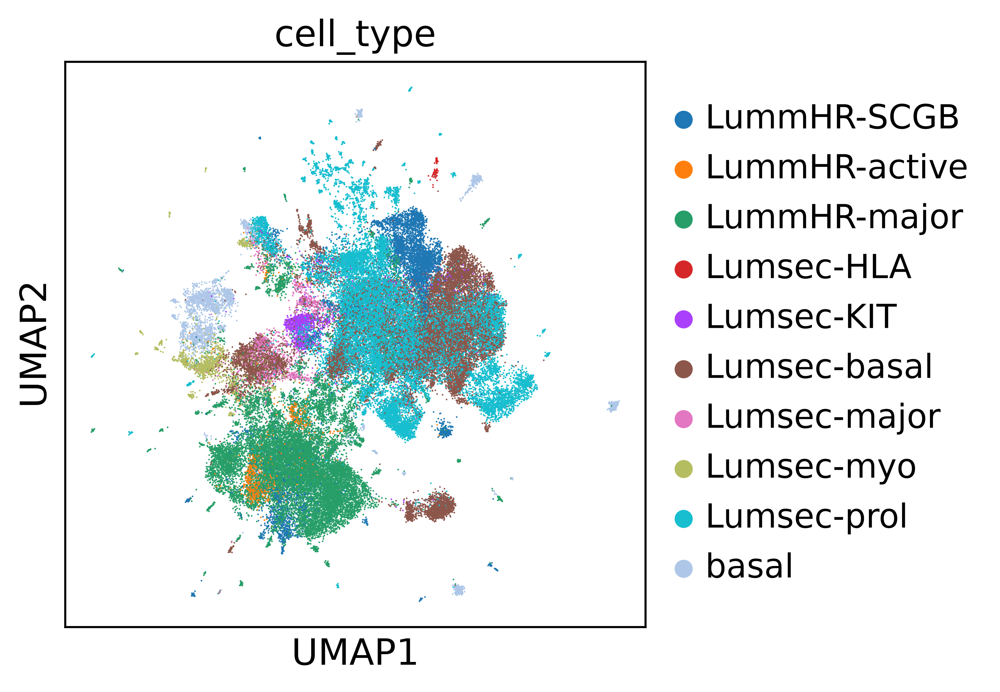

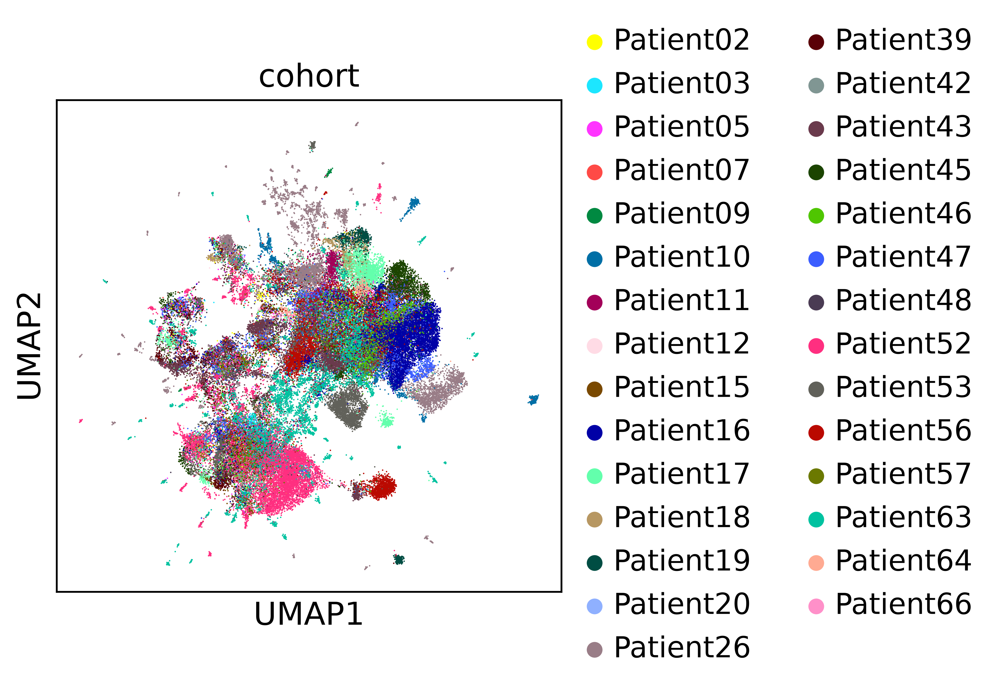

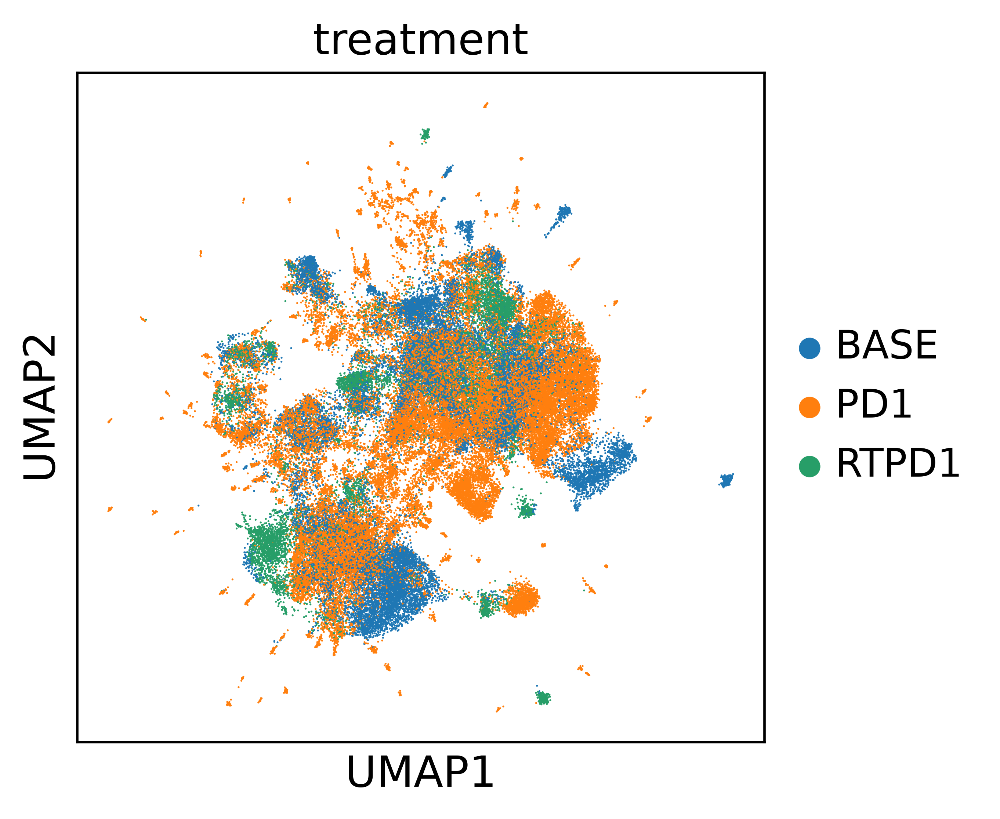

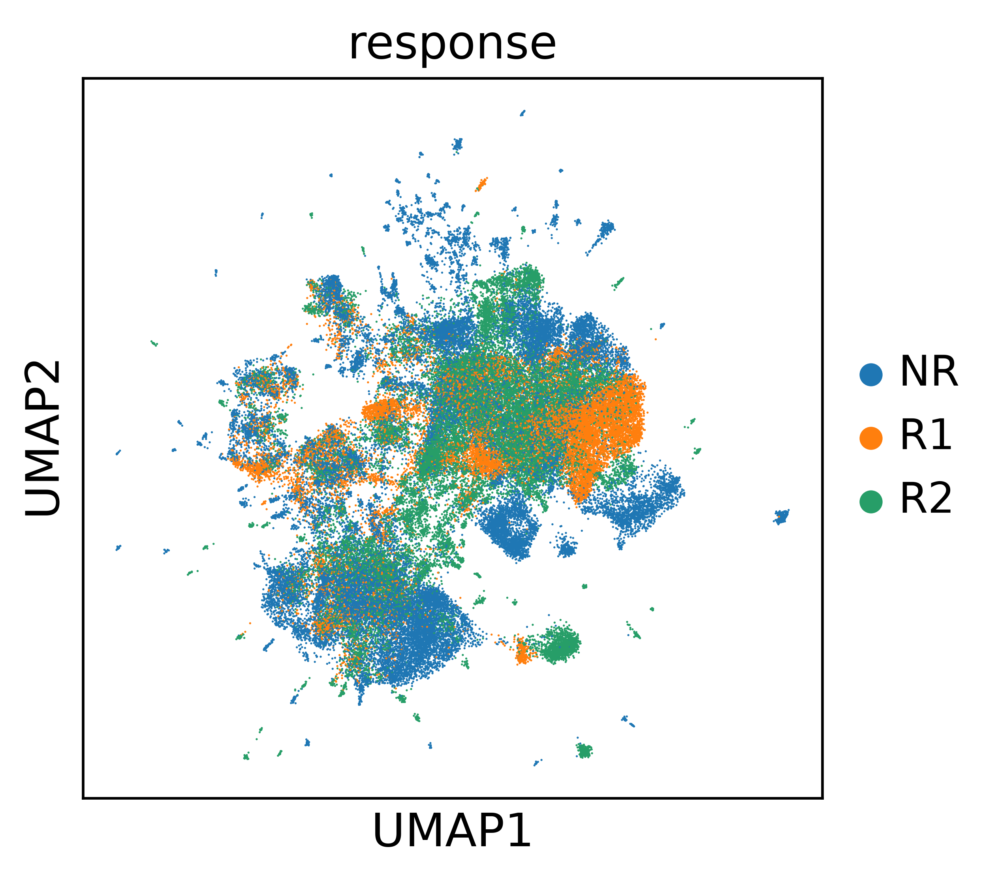

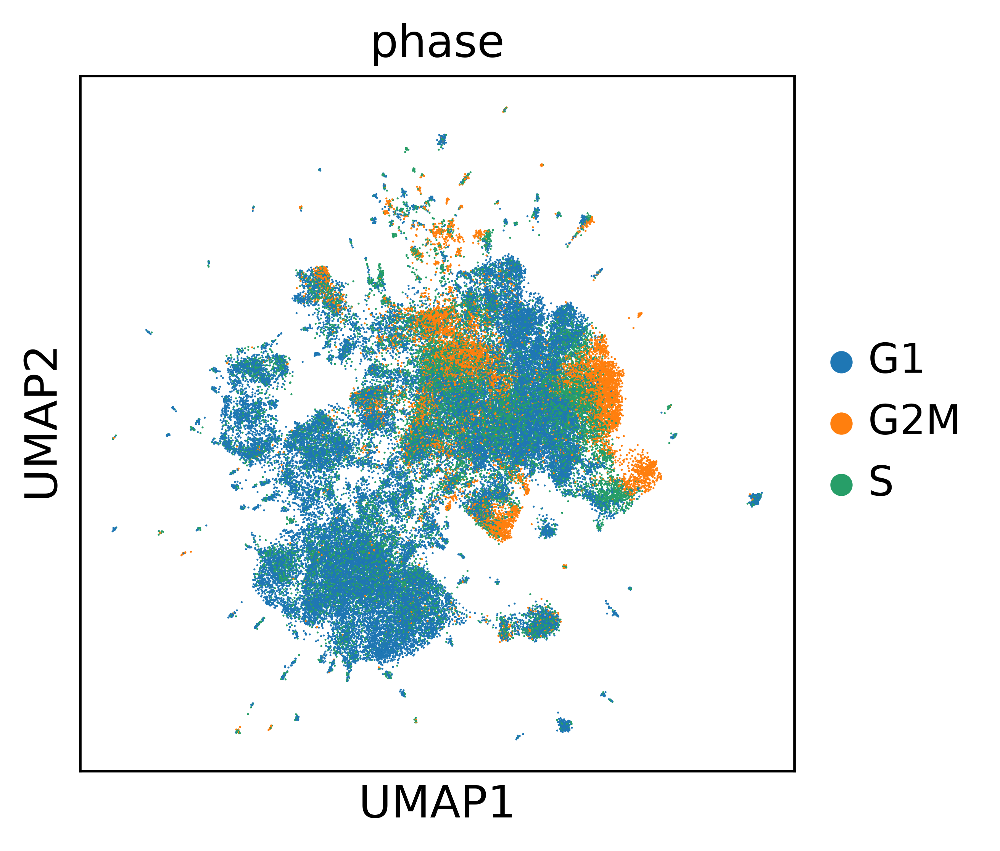

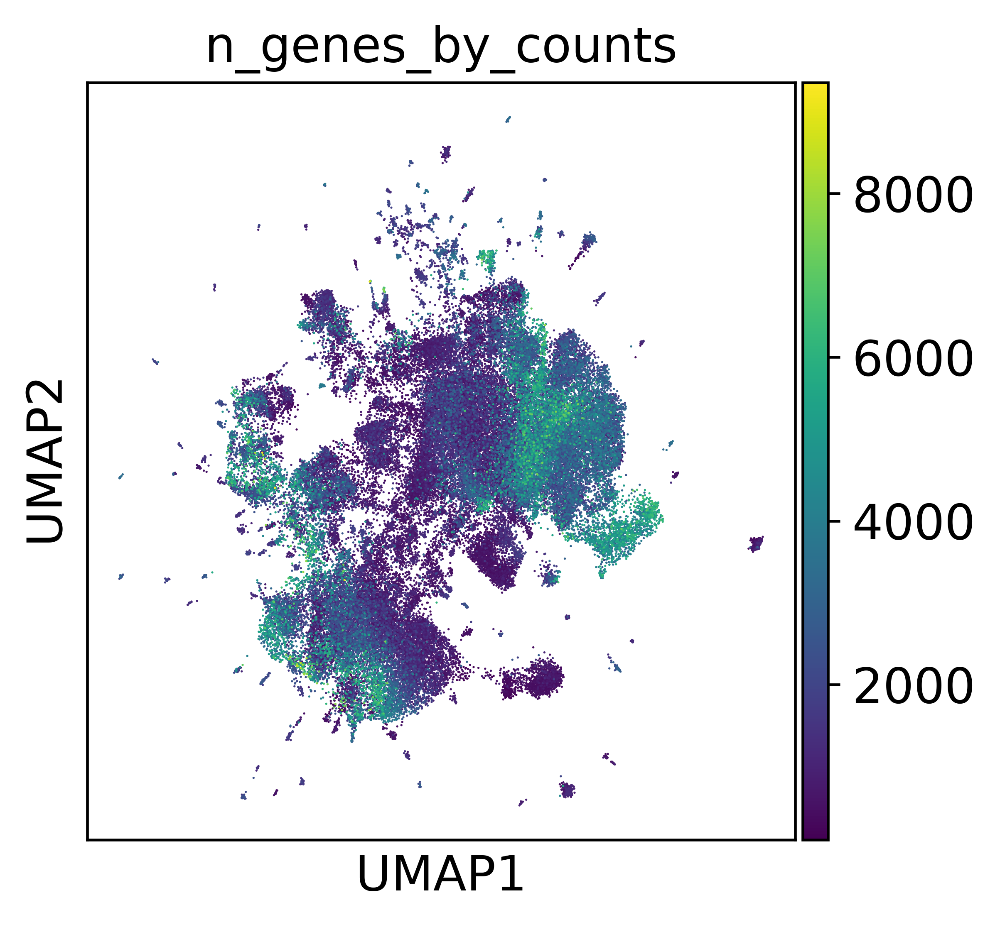

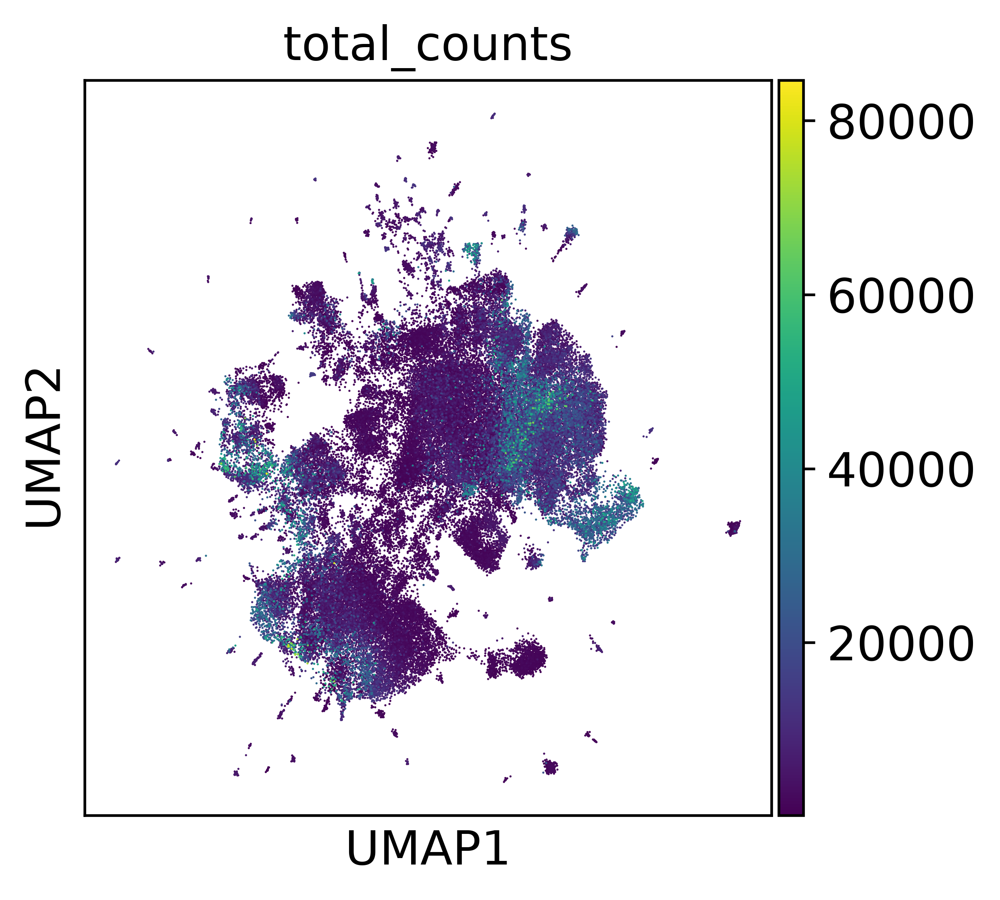

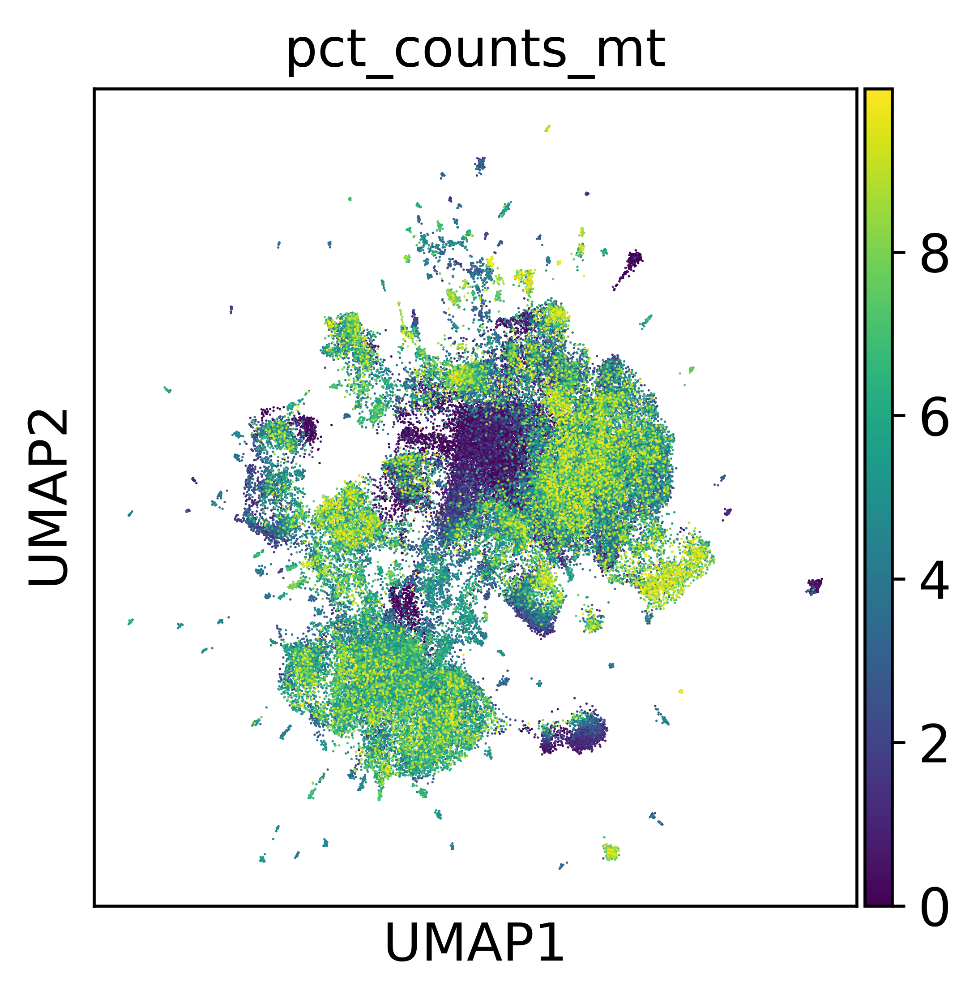

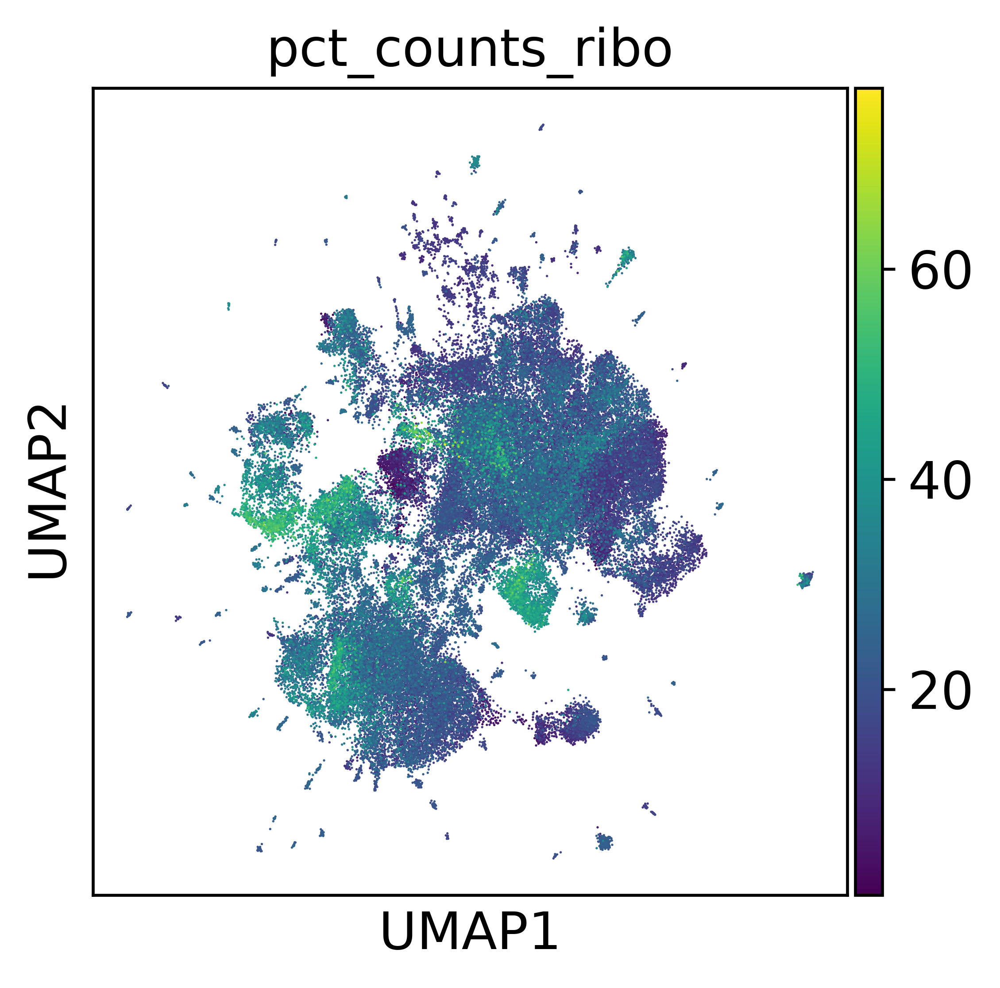

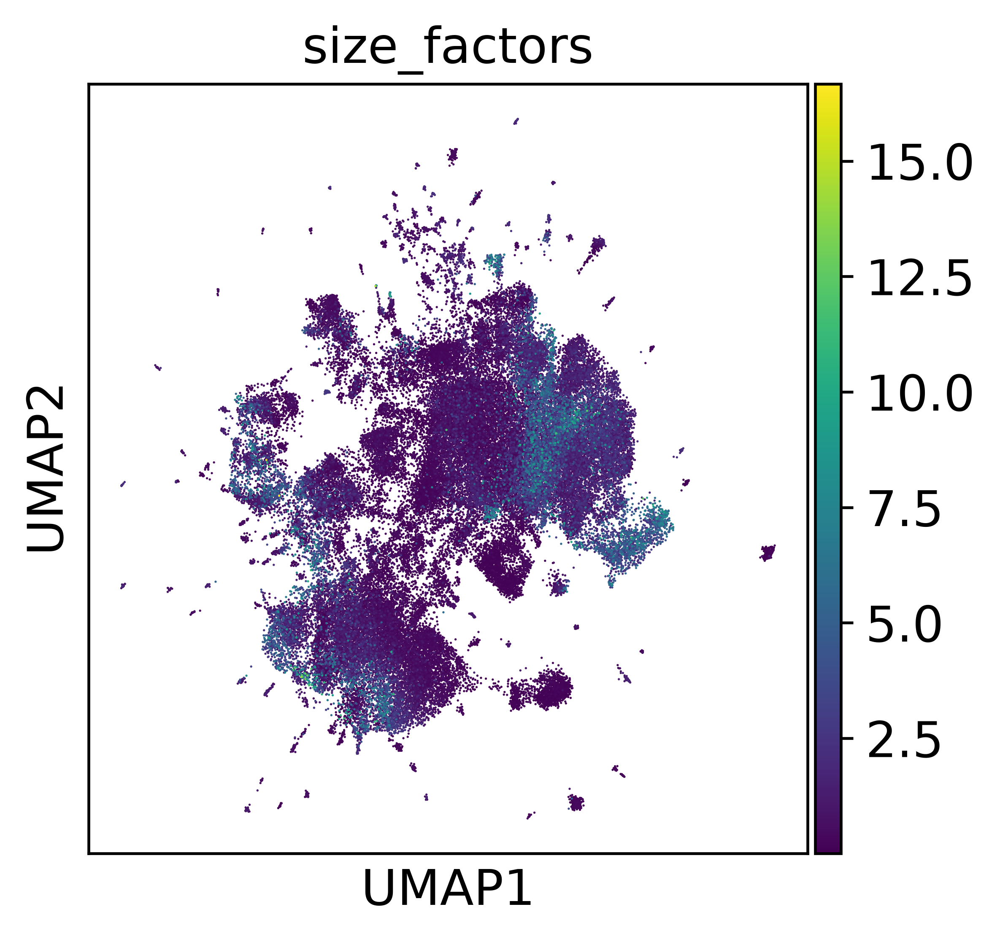

In [14]:
UMAP_QC_KEYS = {
    "cell_type": "cell_type",
    "cohort": "cohort",
    "treatment": "treatment",
    "response": "response",
    "phase": "phase",
    "n_genes_by_counts": "n_genes_by_counts",
    "total_counts": "total_counts",
    "mito": "pct_counts_mt",
    "ribo": "pct_counts_ribo",
    "size_factors": "size_factors",
}

for label, col in UMAP_QC_KEYS.items():
    sc.pl.umap(embed_plot, color=col, save=f"_{label}_{RUN_ID}.png")

In [ ]:
UMAP_COMBINED_KEYS = ["cell_type", "cohort", "treatment", "response", "phase"]

with plt.rc_context({"figure.figsize": (7, 7)}):
    sc.pl.umap(
        embed_plot,
        color=UMAP_COMBINED_KEYS,
        ncols=2,
        wspace=0.8,
        hspace=0.25,
        save=f"_combined_{RUN_ID}.png",
    )

### One panel per cell type

10 of the 11 epithelial labels are observed (`Lumsec-lac` has no cell in this dataset), and
three of them - Lumsec-prol, LummHR-major, Lumsec-basal - are 81% of the compartment, so they
dominate the single `cell_type` UMAP. One panel per label, each highlighting only its own
cells, says where each population actually sits in the DRVI space. It matters more here than
in 03: the labels are sub-labels of one lineage, so they are expected to overlap rather than
to sit in separate islands.

In [ ]:
cell_types = [c for c in embed_plot.obs["cell_type"].cat.categories
              if (embed_plot.obs["cell_type"] == c).any()]

ncols = 4
nrows = int(np.ceil(len(cell_types) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 3.4))
axes = np.atleast_1d(axes).flatten()

for ax, ct in zip(axes, cell_types):
    sc.pl.umap(embed_plot, color="cell_type", groups=[ct], title=ct, ax=ax,
               show=False, legend_loc="none", na_in_legend=False, size=4)
    ax.set_xlabel("")
    ax.set_ylabel("")
for ax in axes[len(cell_types):]:
    ax.set_visible(False)

plt.tight_layout()
savefig("umap_per_cell_type")

## Latent dimensions

How many of the `N_LATENT` dimensions DRVI actually used. A *vanished* dimension carries no
signal: it is the model saying it did not need that much room, and the count is the number
that justifies the choice of `N_LATENT`. If almost nothing vanishes, the latent space is
too small and worth re-running larger.

This is the cell to read before deciding whether to re-run at another size. 32 is the size
of this phase because the compartment is smaller and far less heterogeneous than the one of
03 - 74k cells and 10 labels within a single lineage against 176k and 18 across four - and
the count below is what confirms or refutes that: several vanished dimensions mean 32 was
already generous, none means the run should be repeated at 64 and the two compared.

In [ ]:
n_vanished = int(embed.var["vanished"].sum())
print(f"{n_vanished} vanished / {embed.n_vars} latent dimensions "
      f"({embed.n_vars - n_vanished} effectively used)")

# The dimensions that reconstruct the most, i.e. where to start reading the model.
embed.var.sort_values("reconstruction_effect", ascending=False).head(10)

In [ ]:
# Per-dimension statistics: reconstruction effect, max value, mean, std.
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2, show=False)
savefig("latent_dimension_stats")

# The same, vanished dimensions dropped: the informative half of the plot above.
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2, remove_vanished=True, show=False)
savefig("latent_dimension_stats_rmVanished")

In [ ]:
# Every non-vanished dimension on the UMAP (remove_vanished defaults to True here).
drvi.utils.pl.plot_latent_dims_in_umap(embed, show=False)
savefig("latent_dims_in_umap")

In [ ]:
# Which dimension responds to which cell type. Sorted by dimension first, then grouped by
# label: the second ordering makes it obvious when one label owns a whole dimension.
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "cell_type", title_col="title", show=False)
savefig("latent_dims_in_heatmap_cell_type")
plt.show()

drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "cell_type", title_col="title",
                                          sort_by_categorical=True, show=False)
savefig("latent_dims_in_heatmap_cell_type_sorted")
plt.show()

In [ ]:
# The same heatmap against the batch
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "cohort", title_col="title", show=False)
savefig("latent_dims_in_heatmap_cohort")
plt.show()

# And against treatment
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "treatment", title_col="title", show=False)
savefig("latent_dims_in_heatmap_treatment")
plt.show()

# And against response
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "response", title_col="title", show=False)
savefig("latent_dims_in_heatmap_response")
plt.show()

# And against phase
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "phase", title_col="title", show=False)
savefig("latent_dims_in_heatmap_phase")
plt.show()

### Interpretability (OOD scores)

The out-of-distribution scores come from the decoder reconstructions, so they are fast and
they favour the genes that are *specific* to a dimension.

In [ ]:
model.plot_interpretability_scores(embed, adata, show=False)
savefig("ood_interpretability_scores")
plt.show()

In [ ]:
# Genes (rows) appear in adata order and are not sorted.
ood_scores = model.get_interpretability_scores(embed, adata)
ood_scores.iloc[:10, :10]

The two halves of `OOD_combined`: the min_possible and max_possible log-fold-changes of each
dimension in the OOD setting. See the paper appendix for how they combine.

In [ ]:
ood_max = model.get_interpretability_scores(embed, adata, key="OOD_max_possible")
ood_min = model.get_interpretability_scores(embed, adata, key="OOD_min_possible")
ood_max.iloc[:10, :10]
ood_min.iloc[:10, :10]

In [ ]:
model.plot_interpretability_scores(embed, adata, key="OOD_max_possible", show=False)
savefig("ood_max_interpretability_scores")
plt.show()

model.plot_interpretability_scores(embed, adata, key="OOD_min_possible", show=False)
savefig("ood_min_interpretability_scores")
plt.show()

### Interpretability (IND scores)

This approach iterates over all the cells and averages the effect of each latent factor on
each gene; the scores are already stored in `embed`.

They reflect the broad mechanistic effect of a dimension. Genes are not filtered for
uniqueness, so a gene shared by several dimensions keeps a high score in all of them: the
complete picture of what a factor moves, as opposed to the OOD scores' specific one.

In [ ]:
model.plot_interpretability_scores(embed, adata, key="IND_linear_weighted_mean", show=False)
savefig("ind_linear_weighted_mean")
plt.show()

In [ ]:
# Genes (rows) appear in adata order and are not sorted.
ind_scores = model.get_interpretability_scores(embed, adata, key="IND_linear_weighted_mean")
ind_scores.iloc[:10, :10]

## The compartment in the DRVI space

`embed` above is the model's own view of the run - one var per latent dimension, its stats and
its interpretability scores - and by construction carries no genes. This is the other half:
the definitive 04_1 object (all genes, scran log-norm, leiden) with the latent space added as
`obsm['X_drvi']`, for anything downstream that needs genes and latent coordinates in the same
object. 04_3 works from the embedding alone and does not open this file.

In [ ]:
if OVERWRITE or not DOWNSTREAM_H5AD.exists():
    print(f"[read] {FULL_H5AD}")
    full = sc.read_h5ad(FULL_H5AD)

    # Cell order is not assumed: the latent space is realigned on the 04_1 object's
    # cells by name, so a reordering anywhere upstream cannot pair a cell with
    # another cell's coordinates.
    assert set(embed.obs_names) == set(full.obs_names), \
        "the embedding and the 04_1 object disagree on cells"
    full.obsm["X_drvi"] = np.asarray(embed[full.obs_names].X, dtype=np.float32)
    assert np.isfinite(full.obsm["X_drvi"]).all()

    print(f"Writing {DOWNSTREAM_H5AD.name} (gzip, a few minutes) ...")
    full.write_h5ad(DOWNSTREAM_H5AD, compression="gzip")
    print(f"[write] {DOWNSTREAM_H5AD} "
          f"({full.n_obs:,} x {full.n_vars:,}, obsm['X_drvi'] {full.obsm['X_drvi'].shape}, "
          f"{DOWNSTREAM_H5AD.stat().st_size / 1024 ** 3:.2f} GB on disk)")
    del full
else:
    print(f"[have] {DOWNSTREAM_H5AD} (OVERWRITE=True to rewrite)")